## Лабораторная работа №3

Задание: https://github.com/vlad3942/lecture-notes/blob/main/%D0%9E%D0%98%D0%9C%D0%A3/Practice_04/Practice_04.md

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage.transform import rescale
from scipy.signal import convolve2d
from PIL import Image, ImageFilter
import cv2

### Исходное изображение:

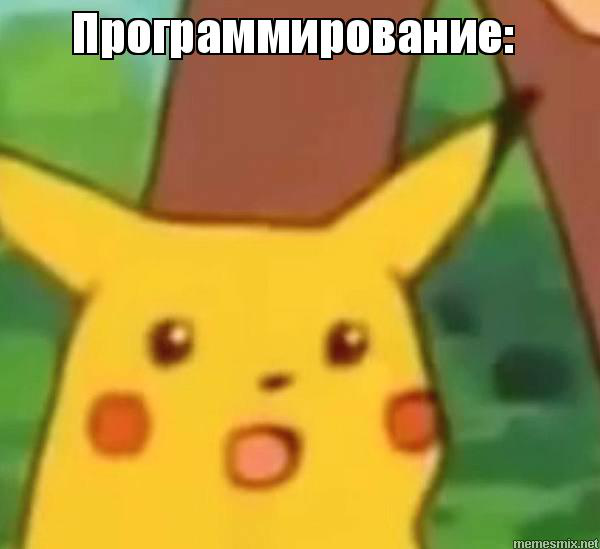

In [5]:
sourceImgName = 'temp.jpg'
img_before = Image.open(sourceImgName)
img_before

### Применить к исходному изображению Гауссово размытие. Отобразить результат.

In [25]:
def showDiff(img1, img2):
    fig, ax = plt.subplots(1, 2)

    ax[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')
    
    ax[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax[1].axis('off')

    fig.set_figwidth(len(img1))    #  ширина и
    fig.set_figheight(len(img1[0]) + 100)    #  высота

    plt.show()

In [28]:
img = cv2.imread(sourceImgName)
img_gaussian = cv2.GaussianBlur(img, ksize=(9, 9), sigmaX=0, sigmaY=0)

cv2.imwrite('gaussian-blure.jpg', img_gaussian)

True

In [29]:
showDiff(img, img_gaussian)

### Реализовать функцию повышения резкости методом усиления границ.

In [23]:
def conv(img, krn):
    
    is0, is1, ks0, ks1 = *img.shape, *krn.shape
    rs0, rs1 = is0 - ks0 + 1, is1 - ks1 + 1
    res = np.zeros((rs0, rs1), dtype = krn.dtype)
    
    for i in range(rs0):
        for j in range(rs1):
            res[i, j] = (krn * img[i : i + ks0, j : j + ks1]).sum()
            
    return res

def get_array(image):
    output_image = image.convert("RGB")
    width = image.width
    height = image.height
    r_arr = np.zeros((width, height))
    g_arr = np.zeros((width, height))
    b_arr = np.zeros((width, height))
    
    for x in range(width):
        for y in range(height):
            r, g, b = output_image.getpixel( (x, y) )
            r_arr[x][y] = r
            g_arr[x][y] = g
            b_arr[x][y] = b
            
    return r_arr, g_arr, b_arr

def create_img(r_arr, g_arr, b_arr):
    sizeX = len(r_arr)
    sizeY = len(r_arr[0])
    
    new_img = Image.new('RGB', (sizeX, sizeY))
    for x in range(sizeX):
        for y in range(sizeY):
            r = int(r_arr[x][y])
            g = int(g_arr[x][y])
            b = int(b_arr[x][y])
            new_img.putpixel( (x, y), (r, g, b) )
            
    return new_img

### Применить построенную функцию к размытому изображению. Вывести результат работы функции вместе с исходным изображением.

In [31]:
img_gaus = Image.open('gaussian-blure.jpg')
sharpness = np.array([[-1,-1,-1],
                      [-1, 9,-1],
                      [-1,-1,-1]])

r_arr, g_arr, b_arr = get_array(img_gaus)
r_c = conv(r_arr, sharpness)
g_c = conv(g_arr, sharpness)
b_c = conv(b_arr, sharpness)


img_sharpness = create_img(r_c, g_c, b_c)
img_sharpness.save('sharpness.jpg')

In [30]:
img_sharpness = cv2.imread('sharpness.jpg')

showDiff(img, img_sharpness)

### Используя две любые функции повышающие резкость изображения, обработать размытое изображение. Результаты также вывести вместе с исходным изображением для сравнения.

In [33]:
img_gaus = Image.open('gaussian-blure.jpg')
sharpness = np.array([[ 0,-1, 0],
                      [-1, 5,-1],
                      [ 0,-1, 0]])

r_arr, g_arr, b_arr = get_array(img_gaus)
r_c = conv(r_arr, sharpness)
g_c = conv(g_arr, sharpness)
b_c = conv(b_arr, sharpness)


img_sharpness = create_img(r_c, g_c, b_c)
img_sharpness.save('sharpness-1.jpg')

In [34]:
img_sharpness = cv2.imread('sharpness-1.jpg')

showDiff(img, img_sharpness)

In [35]:
def get_gauss_kernel(size = 3, sigma = 1):
    center = (int)(size / 2)
    kernel = np.zeros((size, size))
    
    for i in range(size):
       for j in range(size):
          diff = np.sqrt((i-center)**2+(j-center)**2)
          kernel[i,j] = np.exp(-(diff**2)/(2*sigma**2))
    return kernel / np.sum(kernel)

def get_unit_kernel(size):
    kernel = np.zeros((size, size))
    center = (int)(size/2)
    kernel[center][center] = 1
    
    return kernel

In [38]:
gaus = get_gauss_kernel(5, 3)
unit = get_unit_kernel(5)
kernel = unit+5*(unit - gaus)


img_gaus = Image.open('gaussian-blure.jpg')

r_arr, g_arr, b_arr = get_array(img_gaus)
r_c = conv(r_arr, kernel)
g_c = conv(g_arr, kernel)
b_c = conv(b_arr, kernel)


img_sharpness = create_img(r_c, g_c, b_c)
img_sharpness.save('matrix-sharpness.jpg')

In [37]:
img_sharpness = cv2.imread('matrix-sharpness.jpg')

showDiff(img, img_sharpness)